# Import

In [ ]:
import pandas as pd
from google.colab import drive

drive.mount('/content/drive/', force_remount=True)

data_dir = '/content/drive/My Drive/TA/Dataset/WindNasa/'

# List of cities
cities = [
    'Bandung', 'Tasikmalaya', 'Ciamis', 'Bogor', 'KotaTasikmalaya',
    'Lebak', 'KotaBandung', 'Sukabumi', 'Tangerang', 'Garut', 'Serang',
    'Indramayu', 'Cimahi', 'BandungBarat', 'Kuningan', 'WadukCirata',
    'Purwakarta', 'JakartaTimur', 'Majalengka', 'Banjar', 'Sumedang',
    'KotaBogor', 'KotaSukabumi', 'Depok', 'Cirebon',
    'TangerangSelatan', 'Pandeglang', 'Karawang', 'Bekasi', 'Cianjur',
    'KotaBekasi', 'KotaTangerang', 'KotaSerang', 'JakartaSelatan',
    'Cilegon', 'Subang', 'KotaCirebon', 'JakartaBarat', 'JakartaPusat',
    'JakartaUtara'
]

city_dfs = []

for city in cities:
    file_path = f'{data_dir}Wind_{city}.csv'
    try:
        df_city = pd.read_csv(file_path, sep =",", skiprows=10)
        df_city['date'] = pd.to_datetime(df_city['YEAR'].astype(str) + df_city['DOY'].astype(str), format='%Y%j')

        df_city['city'] = city

        city_dfs.append(df_city)
    except FileNotFoundError:
        print(f"File not found for city: {city}. Skipping.")
    except KeyError:
        print(f"Year or DOY column not found in the file for city: {city}. Skipping.")
    except Exception as e:
        print(f"An error occurred processing file for city {city}: {e}. Skipping.")


all_cities_df = pd.concat(city_dfs, ignore_index=True)

print(all_cities_df.head())

print(all_cities_df.info())

Mounted at /content/drive/
   YEAR  DOY  WS10M  WD10M       date     city
0  2023  121   2.02  265.7 2023-05-01  Bandung
1  2023  122   1.08  324.6 2023-05-02  Bandung
2  2023  123   1.65   46.8 2023-05-03  Bandung
3  2023  124   1.00   25.6 2023-05-04  Bandung
4  2023  125   1.06   61.7 2023-05-05  Bandung
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30400 entries, 0 to 30399
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   YEAR    30400 non-null  int64         
 1   DOY     30400 non-null  int64         
 2   WS10M   30400 non-null  float64       
 3   WD10M   30400 non-null  float64       
 4   date    30400 non-null  datetime64[ns]
 5   city    30400 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(2), object(1)
memory usage: 1.4+ MB
None


In [ ]:
all_cities_df.to_csv("/content/drive/My Drive/TA/Dataset/wind.csv")

In [ ]:
import pandas as pd
from google.colab import drive
from statsmodels.tsa.stattools import adfuller
import matplotlib.pyplot as plt
import numpy as np
import datetime
drive.mount('/content/drive/', force_remount=True)

data_dir = '/content/drive/My Drive/TA/Dataset/wind.csv' 


Mounted at /content/drive/


In [ ]:

all_cities_df = pd.read_csv(data_dir)
all_cities_df = all_cities_df.drop(columns=["Unnamed: 0"])
all_cities_df['date'] = pd.to_datetime(all_cities_df['date'])


In [ ]:
all_cities_df.describe()

,YEAR,DOY,WS10M,WD10M,date,u10,v10
count,29200.000000,29200.000000,29200.000000,29200.000000,29200,29200.000000,29200.000000
mean,2023.827397,183.336986,2.660647,159.635065,2024-04-29 12:00:00,-0.471486,0.576497
min,2023.000000,1.000000,0.630000,0.000000,2023-05-01 00:00:00,-5.910035,-5.676846
25%,2023.000000,92.000000,1.830000,93.700000,2023-10-30 00:00:00,-2.052493,-0.683176
50%,2024.000000,183.500000,2.430000,137.750000,2024-04-29 12:00:00,-1.209521,0.558973
75%,2024.000000,275.000000,3.270000,237.700000,2024-10-29 00:00:00,1.259085,1.735001
max,2025.000000,366.000000,9.450000,359.900000,2025-04-29 00:00:00,9.266809,8.373507
std,0.684729,105.559019,1.105997,87.197317,NaN,2.221552,1.677067


In [ ]:
all_cities_df["u10"] = -all_cities_df.WS10M*np.sin(all_cities_df.WD10M*np.pi/180)
all_cities_df["v10"] = -all_cities_df.WS10M*np.cos(all_cities_df.WD10M*np.pi/180)

In [ ]:
all_cities_df

,YEAR,DOY,WS10M,WD10M,date,city,u10,v10
0,2023,121,2.02,265.7,2023-05-01,Bandung,2.014314,0.151457
1,2023,122,1.08,324.6,2023-05-02,Bandung,0.625624,-0.880338
2,2023,123,1.65,46.8,2023-05-03,Bandung,-1.202798,-1.129503
3,2023,124,1.00,25.6,2023-05-04,Bandung,-0.432086,-0.901833
4,2023,125,1.06,61.7,2023-05-05,Bandung,-0.933306,-0.502534
...,...,...,...,...,...,...,...,...
29195,2025,115,1.54,183.1,2025-04-25,JakartaUtara,0.083281,1.537746
29196,2025,116,1.50,88.0,2025-04-26,JakartaUtara,-1.499086,-0.052349
29197,2025,117,2.58,46.2,2025-04-27,JakartaUtara,-1.862141,-1.785729
29198,2025,118,2.10,53.2,2025-04-28,JakartaUtara,-1.681536,-1.257950


In [ ]:
cities = [
    'Bandung', 'Tasikmalaya', 'Ciamis', 'Bogor', 'KotaTasikmalaya',
    'Lebak', 'KotaBandung', 'Sukabumi', 'Tangerang', 'Garut', 'Serang',
    'Indramayu', 'Cimahi', 'BandungBarat', 'Kuningan', 'WadukCirata',
    'Purwakarta', 'JakartaTimur', 'Majalengka', 'Banjar', 'Sumedang',
    'KotaBogor', 'KotaSukabumi', 'Depok', 'Cirebon',
    'TangerangSelatan', 'Pandeglang', 'Karawang', 'Bekasi', 'Cianjur',
    'KotaBekasi', 'KotaTangerang', 'KotaSerang', 'JakartaSelatan',
    'Cilegon', 'Subang', 'KotaCirebon', 'JakartaBarat', 'JakartaPusat',
    'JakartaUtara'
]

p-value: Bandung 2.509696742123884e-07
p-value: Tasikmalaya 1.6527562015721025e-11
p-value: Ciamis 1.0896660945709796e-06
p-value: Bogor 0.0035324543967570035
p-value: KotaTasikmalaya 1.6527562015721025e-11
p-value: Lebak 2.2860820778605646e-05
p-value: KotaBandung 2.509696742123884e-07
p-value: Sukabumi 1.4362669301560967e-10
p-value: Tangerang 9.719595060364816e-05
p-value: Garut 2.1597002639721867e-12
p-value: Serang 9.719595060364816e-05
p-value: Indramayu 0.0015944589499324968
p-value: Cimahi 2.509696742123884e-07
p-value: BandungBarat 2.509696742123884e-07
p-value: Kuningan 0.0006866539095995802
p-value: WadukCirata 6.886476707103059e-07
p-value: Purwakarta 6.886476707103059e-07
p-value: JakartaTimur 0.0035324543967570035
p-value: Majalengka 2.655098768208813e-05
p-value: Banjar 1.0896660945709796e-06
p-value: Sumedang 2.655098768208813e-05
p-value: KotaBogor 0.0035324543967570035
p-value: KotaSukabumi 1.4362669301560967e-10


<ipython-input-46-0bff4a0c1e68>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax= plt.subplots(1, 1, figsize=(7, 5))


p-value: Depok 0.0035324543967570035
p-value: Cirebon 0.0001463201799901778
p-value: TangerangSelatan 0.0035324543967570035
p-value: Pandeglang 0.0009369471609332689
p-value: Karawang 6.886476707103059e-07
p-value: Bekasi 1.990833566075348e-05
p-value: Cianjur 1.4362669301560967e-10
p-value: KotaBekasi 0.0035324543967570035
p-value: KotaTangerang 1.990833566075348e-05
p-value: KotaSerang 9.719595060364816e-05
p-value: JakartaSelatan 1.990833566075348e-05
p-value: Cilegon 9.719595060364816e-05
p-value: Subang 6.886476707103059e-07
p-value: KotaCirebon 0.0001463201799901778
p-value: JakartaBarat 1.990833566075348e-05
p-value: JakartaPusat 1.990833566075348e-05
p-value: JakartaUtara 1.990833566075348e-05


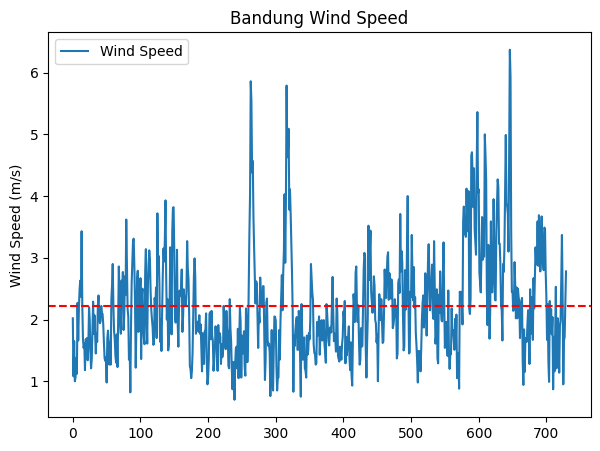

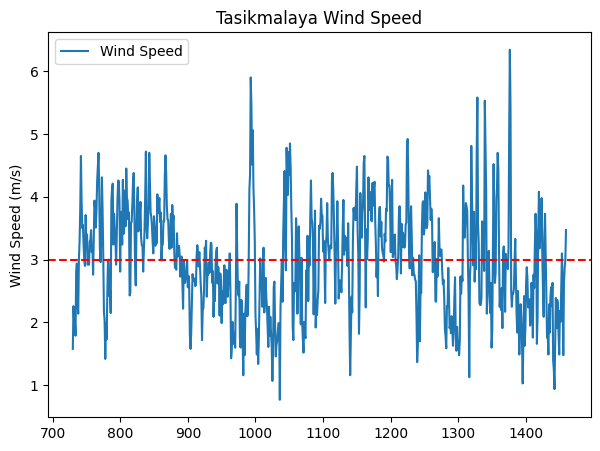

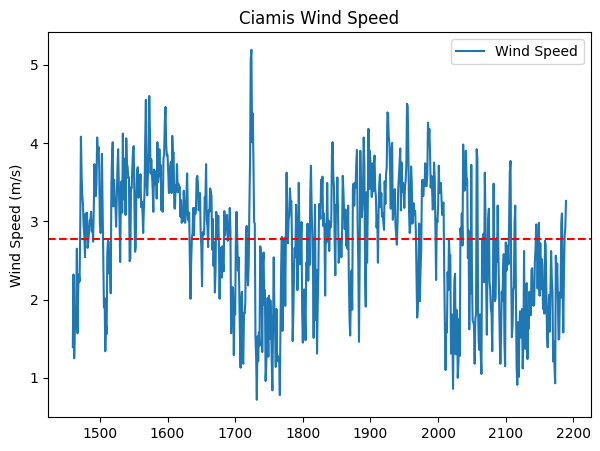

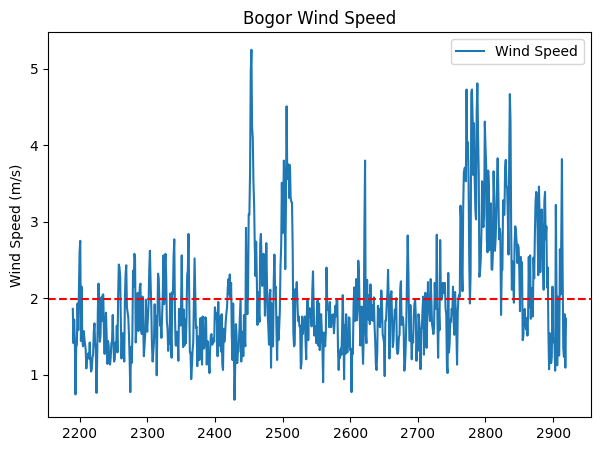

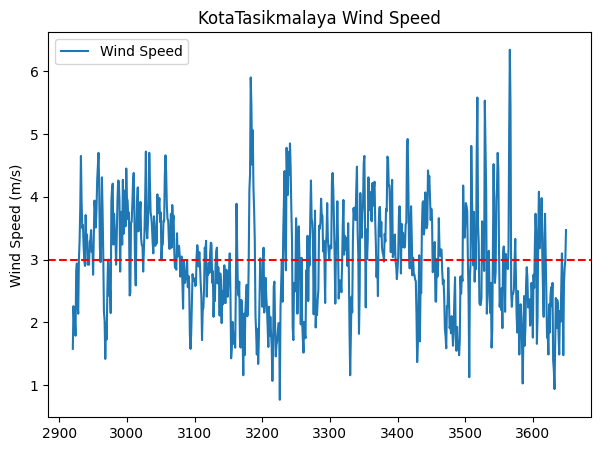

...

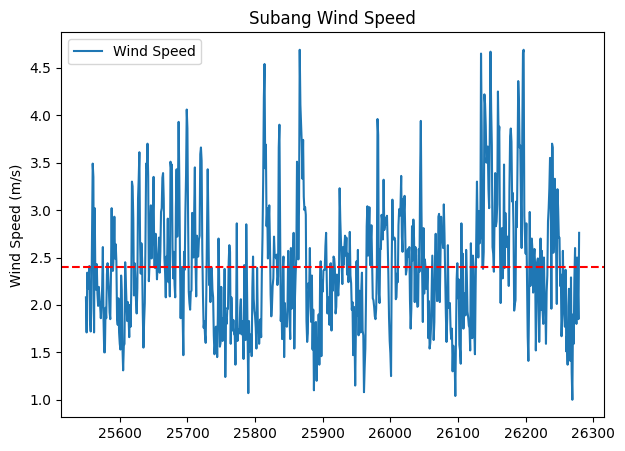

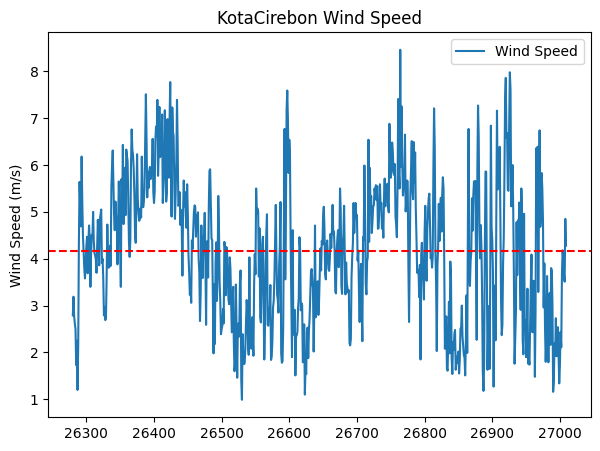

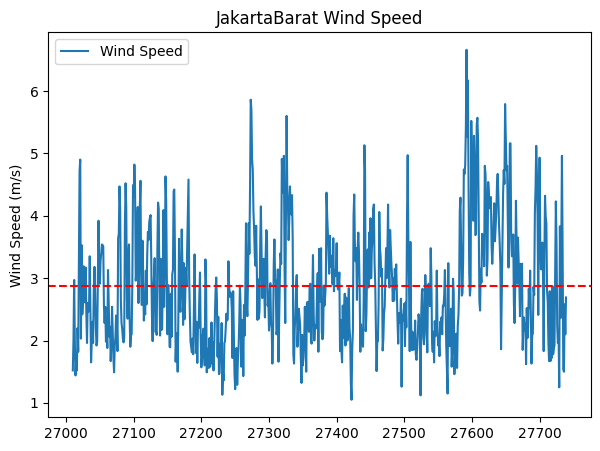

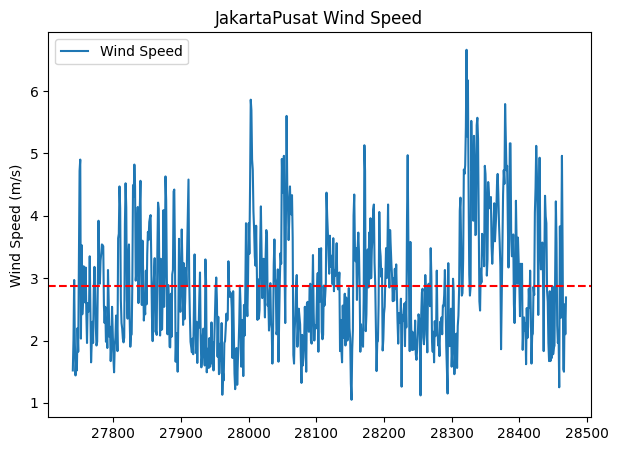

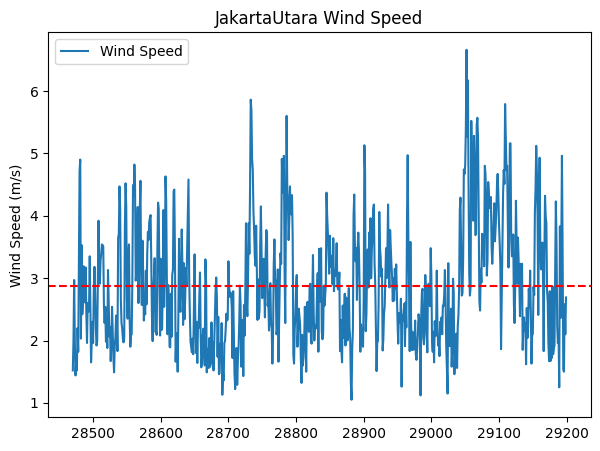

In [ ]:
for city in cities:
  df = all_cities_df[all_cities_df['city'] == city]
  fig, ax= plt.subplots(1, 1, figsize=(7, 5))
  df["WS10M"].plot(kind="line", ax = ax, label="Wind Speed")
  ax.set_title(f"{city} Wind Speed")
  ax.set_ylabel("Wind Speed (m/s)")
  ax.legend()
  ax.axhline(y=np.mean(df["WS10M"]), color='red', linestyle='--', label=f'Mean = {np.mean(df["WS10M"]):.2f}')


  result = adfuller(df["WS10M"])
  print(f'p-value: {city}', result[1])

p-value: Bandung 0.0026236386191516637
p-value: Tasikmalaya 0.0027498248390173162
p-value: Ciamis 0.09276281831903926
p-value: Bogor 0.04045021019830015
p-value: KotaTasikmalaya 0.0027498248390173162
p-value: Lebak 0.06647069241315633
p-value: KotaBandung 0.0026236386191516637
p-value: Sukabumi 0.24591457223539037
p-value: Tangerang 0.031187394533319448
p-value: Garut 0.05194551013076393
p-value: Serang 0.031187394533319448
p-value: Indramayu 0.3241096584489127
p-value: Cimahi 0.0026236386191516637
p-value: BandungBarat 0.0026236386191516637
p-value: Kuningan 0.012057961849294273
p-value: WadukCirata 0.029175178872967
p-value: Purwakarta 0.029175178872967
p-value: JakartaTimur 0.04045021019830015
p-value: Majalengka 0.010750756229412064
p-value: Banjar 0.09276281831903926
p-value: Sumedang 0.010750756229412064
p-value: KotaBogor 0.04045021019830015
p-value: KotaSukabumi 0.24591457223539037


<ipython-input-47-8ae5a73c4237>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax= plt.subplots(1, 1, figsize=(7, 5))


p-value: Depok 0.04045021019830015
p-value: Cirebon 0.3681890711018977
p-value: TangerangSelatan 0.04045021019830015
p-value: Pandeglang 0.04069493581201098
p-value: Karawang 0.029175178872967
p-value: Bekasi 0.09948450254640806
p-value: Cianjur 0.24591457223539037
p-value: KotaBekasi 0.04045021019830015
p-value: KotaTangerang 0.09948450254640806
p-value: KotaSerang 0.031187394533319448
p-value: JakartaSelatan 0.09948450254640806
p-value: Cilegon 0.031187394533319448
p-value: Subang 0.029175178872967
p-value: KotaCirebon 0.3681890711018977
p-value: JakartaBarat 0.09948450254640806
p-value: JakartaPusat 0.09948450254640806
p-value: JakartaUtara 0.09948450254640806


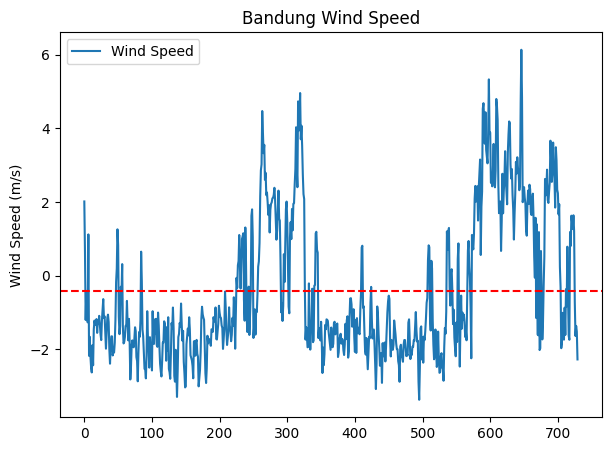

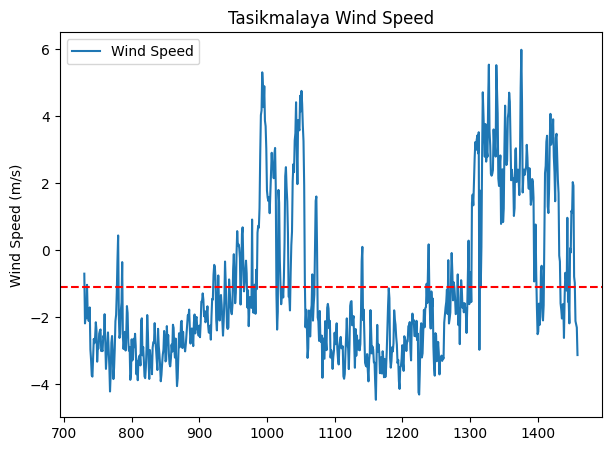

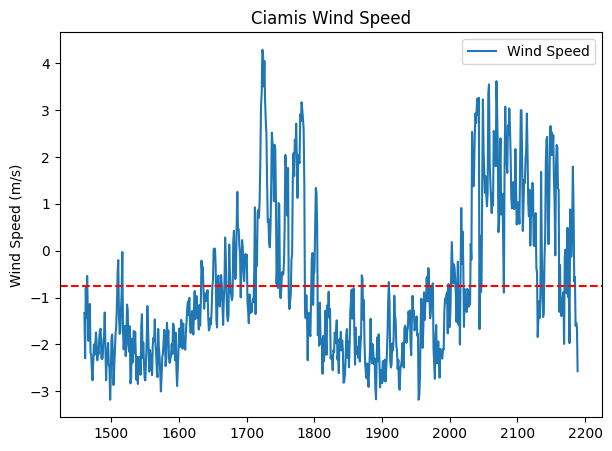

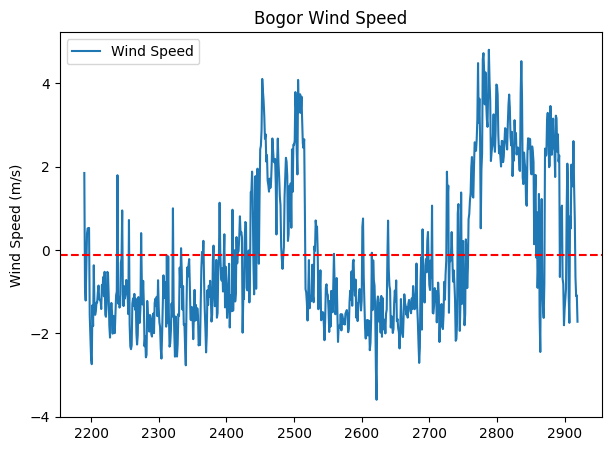

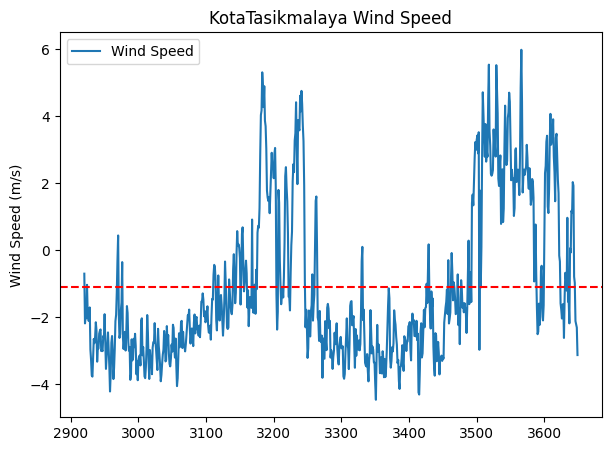

...

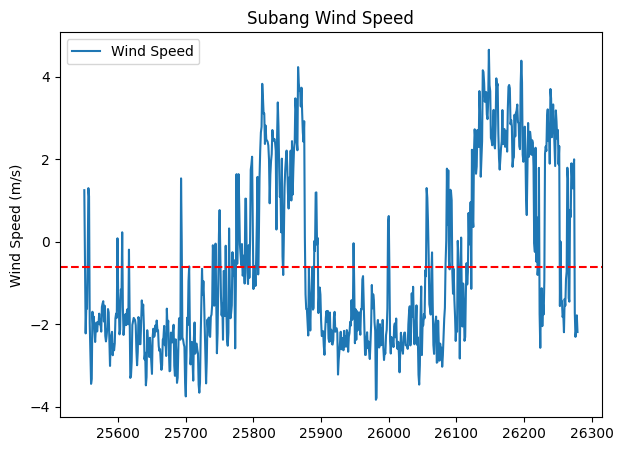

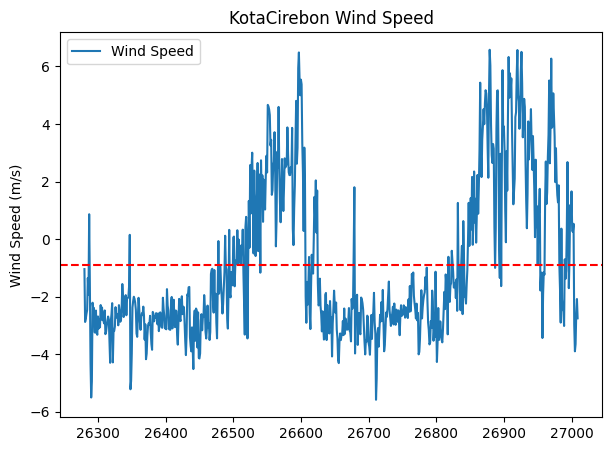

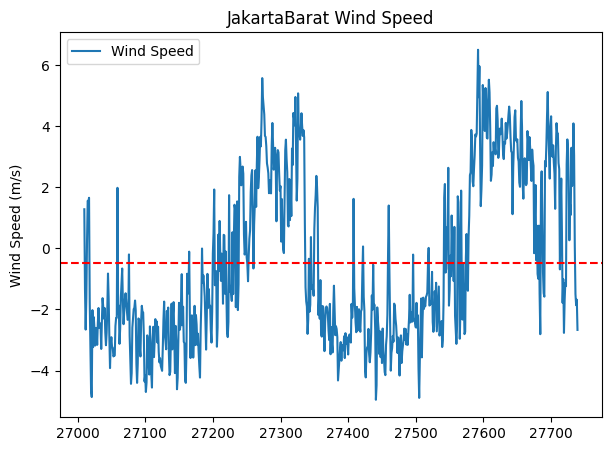

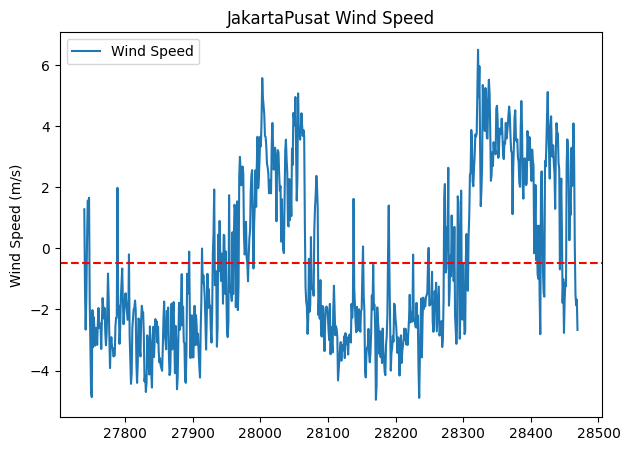

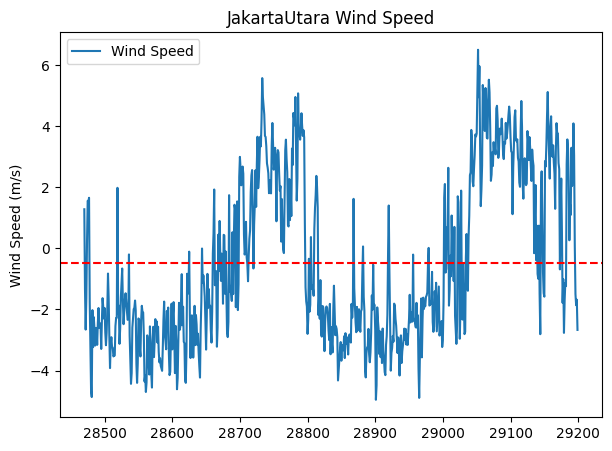

In [ ]:
for city in cities:
  df = all_cities_df[all_cities_df['city'] == city]
  fig, ax= plt.subplots(1, 1, figsize=(7, 5))
  df["u10"].plot(kind="line", ax = ax, label="Wind Speed")
  ax.set_title(f"{city} Wind Speed")
  ax.set_ylabel("Wind Speed (m/s)")
  ax.legend()
  ax.axhline(y=np.mean(df["u10"]), color='red', linestyle='--', label=f'Mean = {np.mean(df["u10"]):.2f}')


  result = adfuller(df["u10"])
  # print(f'ADF Statistic Wind Speed {city}:', result[0])
  print(f'p-value: {city}', result[1])

p-value: Bandung 1.183949932883329e-22
p-value: Tasikmalaya 0.0028829705882513507
p-value: Ciamis 0.07145453556259172
p-value: Bogor 8.263254882985314e-26
p-value: KotaTasikmalaya 0.0028829705882513507
p-value: Lebak 1.0104114197086747e-06
p-value: KotaBandung 1.183949932883329e-22
p-value: Sukabumi 1.0800575982014488e-05
p-value: Tangerang 5.33553708898545e-23
p-value: Garut 9.407602112651643e-05
p-value: Serang 5.33553708898545e-23
p-value: Indramayu 0.44647735804259825
p-value: Cimahi 1.183949932883329e-22
p-value: BandungBarat 1.183949932883329e-22
p-value: Kuningan 0.1857350933909011
p-value: WadukCirata 0.006094801436371509
p-value: Purwakarta 0.006094801436371509
p-value: JakartaTimur 8.263254882985314e-26
p-value: Majalengka 0.22210841874795278
p-value: Banjar 0.07145453556259172
p-value: Sumedang 0.22210841874795278
p-value: KotaBogor 8.263254882985314e-26
p-value: KotaSukabumi 1.0800575982014488e-05
p-value: Depok 8.263254882985314e-26
p-value: Cirebon 0.07956200348610126


<ipython-input-48-e19498afd331>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax= plt.subplots(1, 1, figsize=(7, 5))


p-value: TangerangSelatan 8.263254882985314e-26
p-value: Pandeglang 0.03361667338306096
p-value: Karawang 0.006094801436371509
p-value: Bekasi 2.8062996606441283e-09
p-value: Cianjur 1.0800575982014488e-05
p-value: KotaBekasi 8.263254882985314e-26
p-value: KotaTangerang 2.8062996606441283e-09
p-value: KotaSerang 5.33553708898545e-23
p-value: JakartaSelatan 2.8062996606441283e-09
p-value: Cilegon 5.33553708898545e-23
p-value: Subang 0.006094801436371509
p-value: KotaCirebon 0.07956200348610126
p-value: JakartaBarat 2.8062996606441283e-09
p-value: JakartaPusat 2.8062996606441283e-09
p-value: JakartaUtara 2.8062996606441283e-09


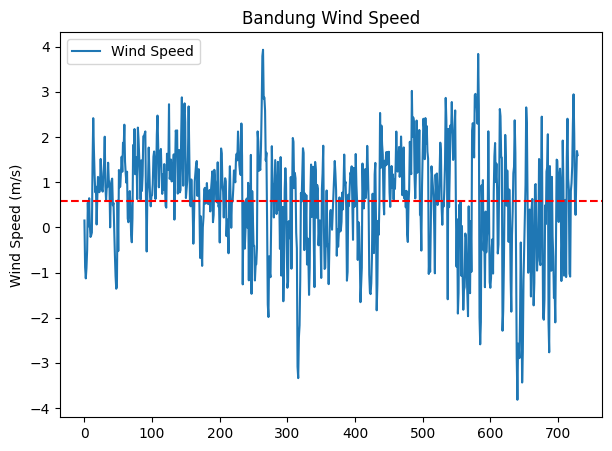

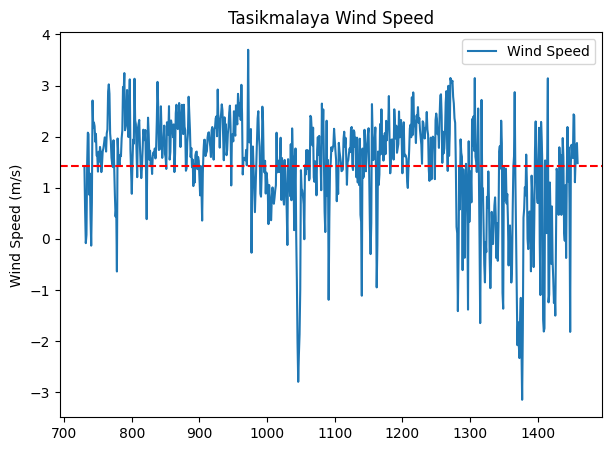

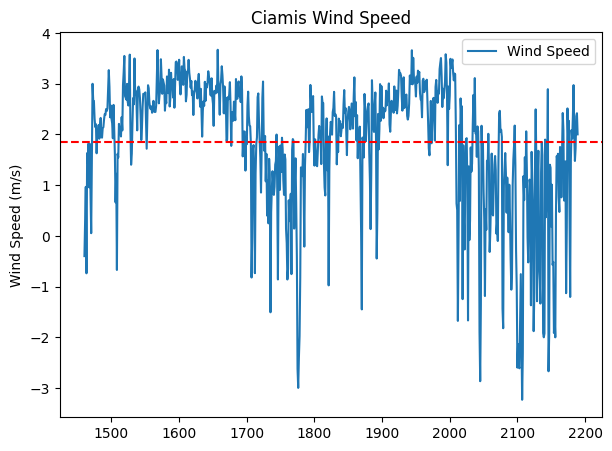

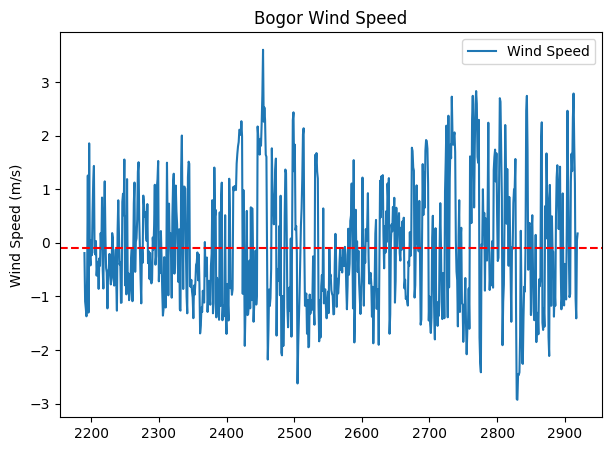

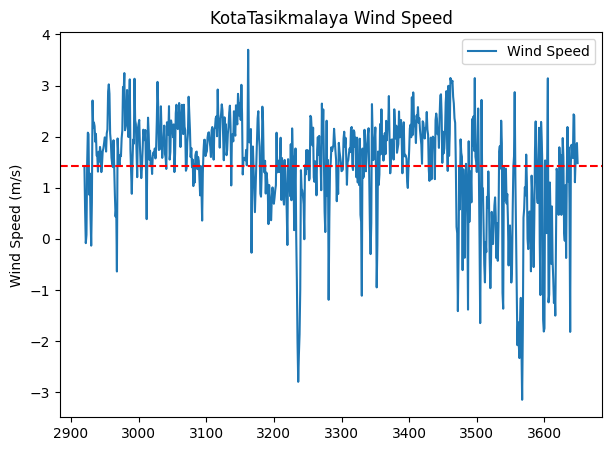

...

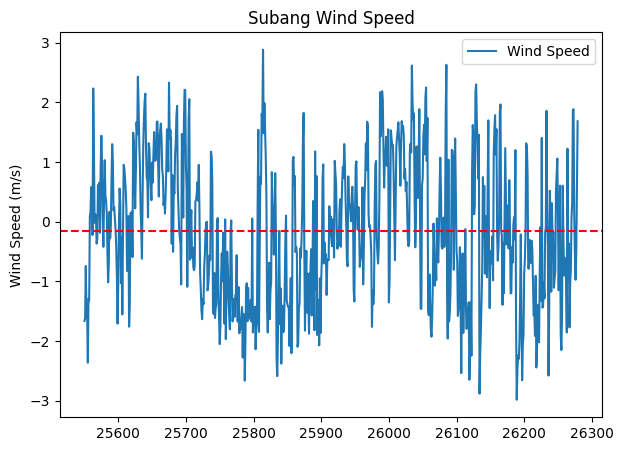

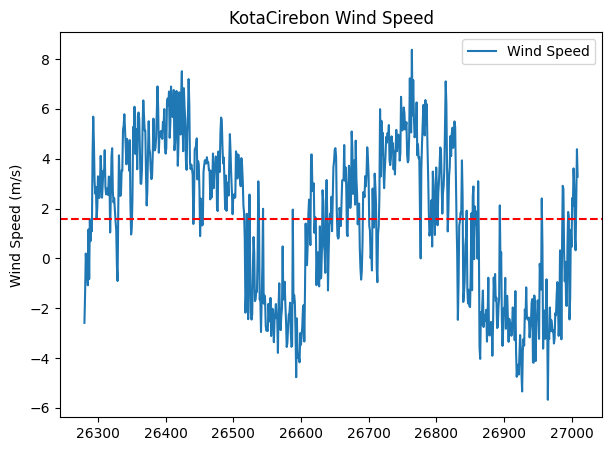

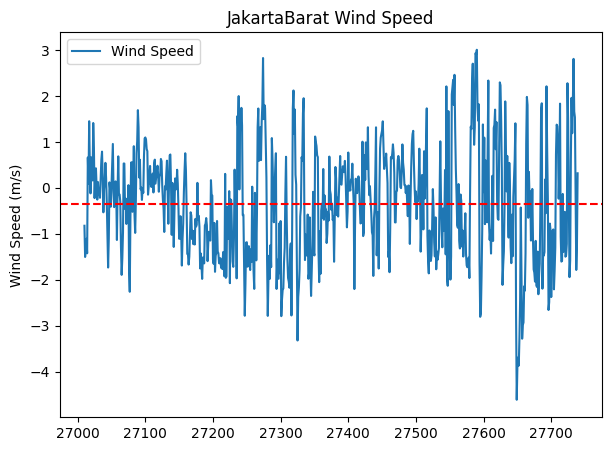

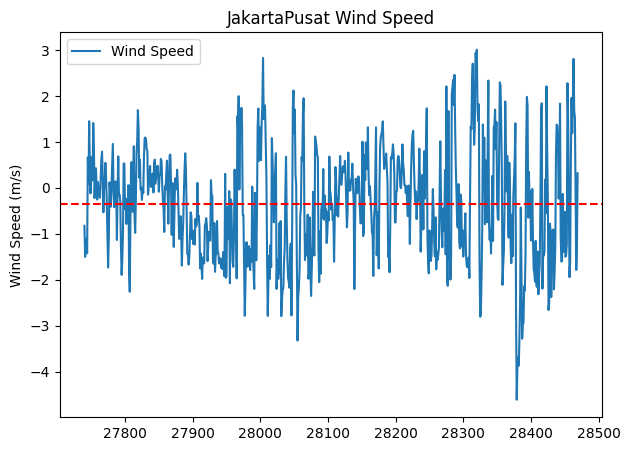

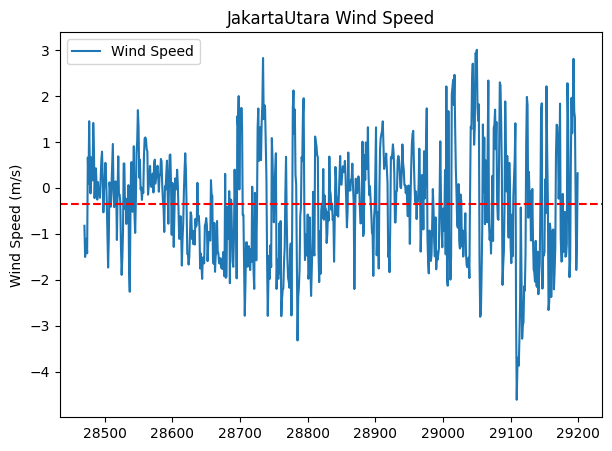

In [ ]:
for city in cities:
  df = all_cities_df[all_cities_df['city'] == city]
  fig, ax= plt.subplots(1, 1, figsize=(7, 5))
  df["v10"].plot(kind="line", ax = ax, label="Wind Speed")
  ax.set_title(f"{city} Wind Speed")
  ax.set_ylabel("Wind Speed (m/s)")
  ax.legend()
  ax.axhline(y=np.mean(df["v10"]), color='red', linestyle='--', label=f'Mean = {np.mean(df["v10"]):.2f}')


  result = adfuller(df["v10"])
  # print(f'ADF Statistic Wind Speed {city}:', result[0])
  print(f'p-value: {city}', result[1])

# Sea Wind Speed

## CO

In [ ]:
import pandas as pd
from google.colab import drive
from statsmodels.tsa.stattools import adfuller
import matplotlib.pyplot as plt
import numpy as np
import datetime
drive.mount('/content/drive/', force_remount=True)

CO = pd.read_csv('/content/drive/My Drive/TA/Dataset/Sea/CO_Sea_cleaned.csv',index_col=False)

CO['date'] = pd.to_datetime(CO['date'])

Mounted at /content/drive/


In [ ]:
CO=CO.drop(columns="Unnamed: 0")

In [ ]:
unique_locations = CO[["longitude", "latitude"]].drop_duplicates().reset_index(drop=True)
display(unique_locations)

,longitude,latitude
0,105.118355,-6.962654
1,105.096213,-6.877330
2,105.092437,-6.780446
3,105.092437,-6.681646
4,105.088452,-6.581827
...,...,...
323,108.363063,-5.890705
324,108.120420,-6.099980
325,108.172203,-5.963239
326,108.239594,-5.988963


In [ ]:
unique_locations_list = list(unique_locations.itertuples(index=False, name=None))
display(unique_locations_list[:5]) 

[(105.11835503121549, -6.962653646397874),
 (105.09621329196123, -6.877329630681501),
 (105.09243733342169, -6.780445809987143),
 (105.09243733341958, -6.68164577690719),
 (105.08845188342649, -6.581827227270834)]

In [ ]:
import requests
import json
import time
import pandas as pd

all_records = []

base_url = (
    "https://power.larc.nasa.gov/api/temporal/daily/point"
    "?parameters=WS10M,WD10M"
    "&community=RE"
    "&latitude={latitude}&longitude={longitude}"
    "&start=20230501&end=20250430"
    "&format=JSON"
)

for lon, lat in unique_locations_list:
    url = base_url.format(latitude=lat, longitude=lon)
    try:
        print(f"Fetching data for ({lat}, {lon})...")
        r = requests.get(url, timeout=10)
        r.raise_for_status()
        data = r.json()
        ws_data = data['properties']['parameter']['WS10M']
        wd_data = data['properties']['parameter']['WD10M']

        for date in ws_data:
            record = {
                "latitude": lat,
                "longitude": lon,
                "date": date,
                "WS10M": ws_data[date],
                "WD10M": wd_data[date]
            }
            all_records.append(record)

        time.sleep(1)

    except Exception as e:
        print(f"❌ Error fetching data for ({lat}, {lon}): {e}")

nasa_wind_df = pd.DataFrame(all_records)

Fetching data for (-6.962653646397874, 105.11835503121549)...
Fetching data for (-6.877329630681501, 105.09621329196123)...
Fetching data for (-6.780445809987143, 105.09243733342169)...
Fetching data for (-6.68164577690719, 105.09243733341958)...
Fetching data for (-6.581827227270834, 105.08845188342649)...
Fetching data for (-6.484045710583164, 105.09243733341934)...
Fetching data for (-7.032915799529183, 105.23948639353712)...
Fetching data for (-6.977747948089025, 105.21858967999184)...
Fetching data for (-6.880314148312977, 105.21742734853524)...
Fetching data for (-6.779332133646549, 105.19748598411104)...
Fetching data for (-6.684541803088294, 105.2205986019252)...
Fetching data for (-6.584245133733481, 105.22937987396114)...
Fetching data for (-6.483351207176698, 105.2178451674269)...
Fetching data for (-7.145412647916005, 105.38712997247649)...
Fetching data for (-7.071355440249613, 105.36356148090326)...
Fetching data for (-6.978045875961863, 105.34403733342252)...
Fetching da

In [ ]:
nasa_wind_df['date'] = pd.to_datetime(nasa_wind_df['date'], format='%Y%m%d')
nasa_wind_df

,latitude,longitude,date,WS10M,WD10M
0,-6.962654,105.118355,2023-05-01,3.28,263.4
1,-6.962654,105.118355,2023-05-02,1.70,269.2
2,-6.962654,105.118355,2023-05-03,3.35,150.1
3,-6.962654,105.118355,2023-05-04,3.48,153.0
4,-6.962654,105.118355,2023-05-05,4.37,175.2
...,...,...,...,...,...
239763,-5.990046,108.363237,2025-04-26,4.05,86.4
239764,-5.990046,108.363237,2025-04-27,3.69,97.4
239765,-5.990046,108.363237,2025-04-28,4.44,125.9
239766,-5.990046,108.363237,2025-04-29,4.96,129.6


In [ ]:
merged_df = pd.merge(nasa_wind_df, CO, on=['latitude', 'longitude', 'date'], how='inner')

display(merged_df.head())

,latitude,longitude,date,WS10M,WD10M,MeanCO
0,-6.962654,105.118355,2023-05-01,3.28,263.4,0.032678
1,-6.962654,105.118355,2023-05-02,1.70,269.2,0.022714
2,-6.962654,105.118355,2023-05-05,4.37,175.2,0.032704
3,-6.962654,105.118355,2023-05-11,4.98,100.5,0.028277
4,-6.962654,105.118355,2023-05-13,7.23,126.8,0.027430


In [ ]:
merged_df.describe()

,latitude,longitude,date,WS10M,WD10M,MeanCO
count,115910.000000,115910.000000,115910,115910.000000,115910.000000,115910.000000
mean,-6.843066,107.133874,2024-04-05 18:02:29.453886208,4.128587,157.270851,0.032315
min,-7.964794,104.968469,2023-05-01 00:00:00,0.700000,0.000000,0.002131
25%,-7.478359,105.967680,2023-10-02 00:00:00,2.770000,121.300000,0.027816
50%,-6.883488,107.101275,2024-04-07 00:00:00,3.900000,140.400000,0.031163
75%,-6.187646,108.474053,2024-09-18 00:00:00,5.270000,170.400000,0.035659
max,-5.627853,108.980321,2025-04-29 00:00:00,10.880000,359.600000,0.066239
std,0.671745,1.260047,NaN,1.732789,65.881358,0.006402


In [ ]:
merged_df.to_csv("/content/drive/My Drive/TA/Dataset/Sea/CO_Sea_wind.csv")

## NO2

In [ ]:
NO2 = pd.read_csv('/content/drive/My Drive/TA/Dataset/Sea/NO2_Sea_cleaned.csv',index_col=False) 
NO2=NO2.drop(columns="Unnamed: 0")
unique_locations = NO2[["longitude", "latitude"]].drop_duplicates().reset_index(drop=True)
display(unique_locations)
NO2['date'] = pd.to_datetime(NO2['date'])

,longitude,latitude
0,105.023528,-6.842984
1,105.003719,-6.767207
2,104.974697,-6.678569
3,104.968469,-6.583673
4,104.985761,-6.490722
...,...,...
323,107.556996,-5.923404
324,108.408228,-6.362869
325,108.624213,-7.186427
326,108.941635,-6.623920


In [ ]:

unique_locations_list = list(unique_locations.itertuples(index=False, name=None))
display(unique_locations_list[:5])

[(105.02352849842428, -6.842984133804519),
 (105.00371938489212, -6.767206808454848),
 (104.97469700429303, -6.678568970533868),
 (104.9684688095775, -6.583672520429911),
 (104.98576127579112, -6.49072248718153)]

In [ ]:
import requests
import json
import time

all_records = []

base_url = (
    "https://power.larc.nasa.gov/api/temporal/daily/point"
    "?parameters=WS10M,WD10M"
    "&community=RE"
    "&latitude={latitude}&longitude={longitude}"
    "&start=20230501&end=20250430"
    "&format=JSON"
)

# Iterate through the list of tuples
for lon, lat in unique_locations_list:
    url = base_url.format(latitude=lat, longitude=lon)
    try:
        print(f"Fetching data for ({lat}, {lon})...")
        r = requests.get(url, timeout=10)
        r.raise_for_status()
        data = r.json()
        ws_data = data['properties']['parameter']['WS10M']
        wd_data = data['properties']['parameter']['WD10M']

        for date in ws_data:
            record = {
                "latitude": lat,
                "longitude": lon,
                "date": date,
                "WS10M": ws_data[date],
                "WD10M": wd_data[date]
            }
            all_records.append(record)

        time.sleep(1)

    except Exception as e:
        print(f"❌ Error fetching data for ({lat}, {lon}): {e}")

nasa_wind_df = pd.DataFrame(all_records)

Fetching data for (-6.842984133804519, 105.02352849842428)...
Fetching data for (-6.767206808454848, 105.00371938489212)...
Fetching data for (-6.678568970533868, 104.97469700429303)...
Fetching data for (-6.583672520429911, 104.9684688095775)...
Fetching data for (-6.49072248718153, 104.98576127579112)...
Fetching data for (-6.4232091114685295, 105.0148485941002)...
Fetching data for (-6.962653646397874, 105.11835503121549)...
Fetching data for (-6.877329630681501, 105.09621329196123)...
Fetching data for (-6.780445809987143, 105.09243733342169)...
Fetching data for (-6.68164577690719, 105.09243733341958)...
Fetching data for (-6.581827227270834, 105.08845188342649)...
Fetching data for (-6.484045710583164, 105.09243733341934)...
Fetching data for (-6.396958682479935, 105.1008601998204)...
Fetching data for (-7.032915799529183, 105.23948639353712)...
Fetching data for (-6.977747948089025, 105.21858967999184)...
Fetching data for (-6.880314148312977, 105.21742734853524)...
Fetching dat

KeyboardInterrupt: 

In [ ]:
nasa_wind_df['date'] = pd.to_datetime(nasa_wind_df['date'], format='%Y%m%d')
nasa_wind_df

In [ ]:
merged_df = pd.merge(nasa_wind_df, NO2, on=['latitude', 'longitude', 'date'], how='inner')

display(merged_df.head())

In [ ]:
merged_df.describe()
merged_df.to_csv("/content/drive/My Drive/TA/Dataset/Sea/NO2_wind.csv")

In [ ]:
merged_df = pd.read_csv("/content/drive/My Drive/TA/Dataset/Sea/NO2_wind.csv").iloc[:,1:]

In [ ]:
merged_df

,latitude,longitude,date,WS10M,WD10M,MeanNO2
0,-6.842984,105.023528,2023-05-01,3.28,263.4,0.000010
1,-6.842984,105.023528,2023-05-02,1.70,269.2,0.000011
2,-6.842984,105.023528,2023-05-03,3.35,150.1,0.000017
3,-6.842984,105.023528,2023-05-04,3.48,153.0,0.000022
4,-6.842984,105.023528,2023-05-05,4.37,175.2,0.000019
...,...,...,...,...,...,...
171757,-6.968931,108.784252,2025-04-22,2.70,203.9,0.000012
171758,-6.968931,108.784252,2025-04-24,1.96,142.8,0.000020
171759,-6.968931,108.784252,2025-04-27,2.56,156.9,0.000014
171760,-6.968931,108.784252,2025-04-28,3.22,165.9,0.000005


In [ ]:
#Gabungkan dengan Data pada Titik Koordinat yang Gagal Diekstrak Sebelumnya
df_location = pd.read_csv("/content/drive/My Drive/TA/Dataset/Sea/POWER_Point_Daily_20230501_20250429_006d10S_108d12E_LST.csv", skiprows=2, header=0)

df_location['date'] = pd.to_datetime(df_location['YEAR'].astype(str) + df_location['MO'].astype(str).str.zfill(2) + df_location['DY'].astype(str).str.zfill(2), format='%Y%m%d')

df_location['longitude'] = 108.12041965383447
df_location['latitude'] = -6.099980334599607

df_location = df_location[['WS10M', 'WD10M', 'date', 'longitude', 'latitude']]

display(df_location.head())

,WS10M,WD10M,date,longitude,latitude
0,2.52,1.7,2023-05-01,108.12042,-6.09998
1,3.12,38.3,2023-05-02,108.12042,-6.09998
2,3.30,87.3,2023-05-03,108.12042,-6.09998
3,2.49,90.4,2023-05-04,108.12042,-6.09998
4,2.46,89.7,2023-05-05,108.12042,-6.09998


In [ ]:
err_df = pd.merge(df_location, NO2, on=['latitude', 'longitude', 'date'], how='inner')

In [ ]:
err_df

,WS10M,WD10M,date,longitude,latitude,MeanNO2
0,3.12,38.3,2023-05-02,108.12042,-6.09998,0.000020
1,3.30,87.3,2023-05-03,108.12042,-6.09998,0.000022
2,2.49,90.4,2023-05-04,108.12042,-6.09998,0.000033
3,2.46,89.7,2023-05-05,108.12042,-6.09998,0.000018
4,2.02,24.6,2023-05-06,108.12042,-6.09998,0.000017
...,...,...,...,...,...,...
523,3.39,114.2,2025-04-25,108.12042,-6.09998,0.000012
524,4.05,86.4,2025-04-26,108.12042,-6.09998,0.000030
525,3.69,97.4,2025-04-27,108.12042,-6.09998,0.000020
526,4.44,125.9,2025-04-28,108.12042,-6.09998,0.000011


In [ ]:
merged_df = pd.concat([merged_df, err_df], ignore_index=True)
display(merged_df.head())

,latitude,longitude,date,WS10M,WD10M,MeanNO2
0,-6.842984,105.023528,2023-05-01,3.28,263.4,0.000010
1,-6.842984,105.023528,2023-05-02,1.70,269.2,0.000011
2,-6.842984,105.023528,2023-05-03,3.35,150.1,0.000017
3,-6.842984,105.023528,2023-05-04,3.48,153.0,0.000022
4,-6.842984,105.023528,2023-05-05,4.37,175.2,0.000019


In [ ]:
merged_df.describe()

,latitude,longitude,WS10M,WD10M,MeanNO2
count,172290.000000,172290.000000,172290.000000,172290.000000,1.722900e+05
mean,-6.749284,107.080567,4.195486,154.557241,2.450492e-05
std,0.703051,1.246113,1.727974,66.380468,2.589195e-05
min,-7.964794,104.968469,0.700000,0.000000,2.033114e-09
25%,-7.463549,105.958325,2.830000,117.900000,1.228545e-05
50%,-6.688445,106.993846,4.010000,137.700000,1.824984e-05
75%,-6.084429,108.363063,5.360000,168.400000,2.737858e-05
max,-5.627853,108.980321,11.260000,359.600000,7.326844e-04


In [ ]:
merged_df.to_csv("/content/drive/My Drive/TA/Dataset/Sea/NO2_Sea_wind.csv")